# DeepDreaming with TensorFlow - a bit of exploration

>[Parameters tweaking](#tweaking)

>[Visualization of filters' effects](#filters)

>[Deepdreaming](#deepdreaming)

Purpose of this notebook is to dive a bit deeper into the DeepDreaming technique as presented in [this marvelous tutorial](https://github.com/tensorflow/tensorflow/blob/master/tensorflow/examples/tutorials/deepdream/deepdream.ipynb). There are several main contributions on top of the original work:
 1. to present the readers how changing parameters affect resulting image
 2. to show that layers closer to the output capture more complicated patterns compared to layers deeper in the convolutional network
 3. to apply the effect on more pictures to see how identified patterns emerge on different parts of images depeding on their geometrical shape
 4. to put the functions into a separate file so that they can be used with more ease


In [8]:
# boilerplate code
from __future__ import print_function
import os
from io import BytesIO
import numpy as np
from functools import partial
import PIL.Image
from IPython.display import clear_output, Image, display, HTML
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib import gridspec
# import skimage.transform.resize

%matplotlib inline

In [9]:
%run deepdream_functions.py

In [10]:
model_fn = '../model/tensorflow_inception_graph.pb'

# creating TensorFlow session and loading the model

# define the grapg object
graph = tf.Graph()

# start the session
sess = tf.InteractiveSession(graph=graph)

# FastGFile is a file I/O wrapper
# see https://stackoverflow.com/questions/47059848/difference-between-tensorflows-graph-and-graphdef
with tf.gfile.FastGFile(model_fn, 'rb') as f:
    
    # create protobuf from the .pb file
    graph_def = tf.GraphDef()    # type tensorflow.core.framework.graph_pb2.GraphDef
    graph_def.ParseFromString(f.read())
    
# define the input tensor
t_input = tf.placeholder(np.float32, name='input') 

# some predefined mean - probably pre-calculated
imagenet_mean = 117.0

# simultaneously subtract mean and insert dimension of [1] at the first position
t_preprocessed = tf.expand_dims(t_input-imagenet_mean, 0)

tf.import_graph_def(graph_def, {'input':t_preprocessed})

In [11]:
# graph.get_operations() return the list of operations in the graph.
# each operation has type, e.g. graph.get_operations()[1].type
# should have also 'import/' in its name (but all have?)
layers = [op.name for op in graph.get_operations() if op.type=='Conv2D' and 'import/' in op.name]

# https://stackoverflow.com/questions/37096225/how-to-understand-static-shape-and-dynamic-shape-in-tensorflow

# get_shape() returns static shape of a tensor (i.e. one that does not change)
# the last dimension is no. imput layers [batch, in_height, in_width, in_channels]
# ':0' has to be added at the end
# -> feature_nums is a vector of in_channel lengths for each Conv2D tensor 
feature_nums = [int(graph.get_tensor_by_name(name+':0').get_shape()[-1]) for name in layers]

print('Number of layers', len(layers))
print('Total number of feature channels:', sum(feature_nums))


Number of layers 59
Total number of feature channels: 7548


In [12]:
# Picking some internal layer. Note that we use outputs before applying the ReLU nonlinearity
# to have non-zero gradients for features with negative initial activations.

# search for 'mixed4d' inception modul
# it is probably the 1x1 bottlenect layer
layer_0 = 'mixed4d_3x3_bottleneck_pre_relu'
channel = 120 # picking some feature channel to visualize

# start with a gray image with a little noise
img_noise = np.random.uniform(size=(224,224,3)) + 100.0


In [13]:
# rerun function definition. Returns error without this step. 
%run deepdream_functions.py

<a id='tweaking'></a>
## Parameters tweaking

The original Deepdream notebook comes with the functions' parameters already tuned to render the graphics nicely. These pre-set levels of parameters are used in most visualizations in this notebook. It is however interesting to see how these parameters affect results when changed.

In the following section I show how various levels of parameters change the deepdream visuaizations. Parameters that will be changed are `iter_n`, `step`, `octave_n` and `octave_scale`. Only one parameter is explored at a time while other parameters stay fixed at their original levels $iter\_n=10$, $step=1.5$, $octave\_n=4$, $octave\_scale=1.4$. 

From the pictures below one sees that `octave_n` and `octave_scale` are related to size of the filers' effects (relative to the size of underlying image). On the other hand `iter_n` and `step` affect magnitude of the filters' effects.

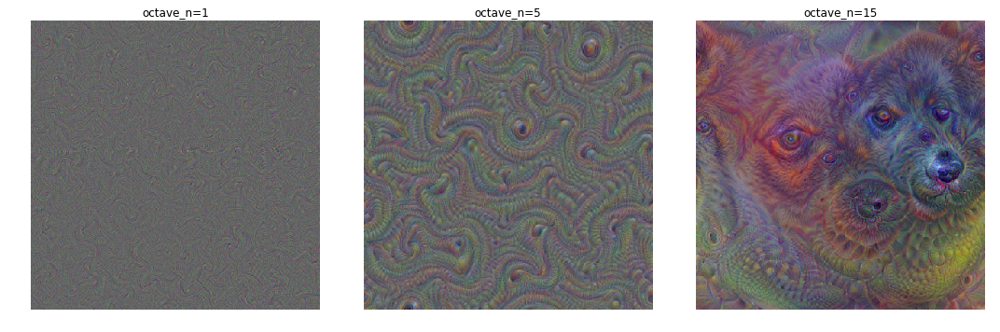

In [7]:
# define figure
fig = plt.figure(figsize=(15, 12))
param_grid = [1,5,15]
param_name = 'octave_n'

# iterate over all param_grid levels
for i, param_val in enumerate(param_grid):
    # save rendered feature map
    rendered_noise = load_render_deepdream(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph,
                                           octave_n=param_val,
                                           render_image=False)
    a=fig.add_subplot(1,3,i+1)
    plt.imshow(rendered_noise)
    plt.axis('off')
    plt.tight_layout()
    plt.title(param_name + '=' + str(param_val))

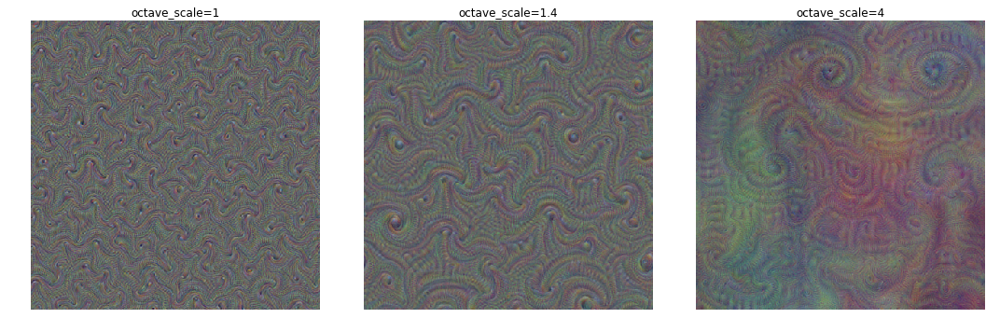

In [14]:
# define figure
fig = plt.figure(figsize=(15, 12))
param_grid = [1,1.4,4]
param_name = 'octave_scale'

# iterate over all param_grid levels
for i, param_val in enumerate(param_grid):
    # save rendered feature map
    rendered_noise = load_render_deepdream(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph,
                                           octave_scale=param_val,
                                           render_image=False)
    a=fig.add_subplot(1,3,i+1)
    plt.imshow(rendered_noise)
    plt.axis('off')
    plt.tight_layout()
    plt.title(param_name + '=' + str(param_val))

In [15]:
type(fig)

matplotlib.figure.Figure

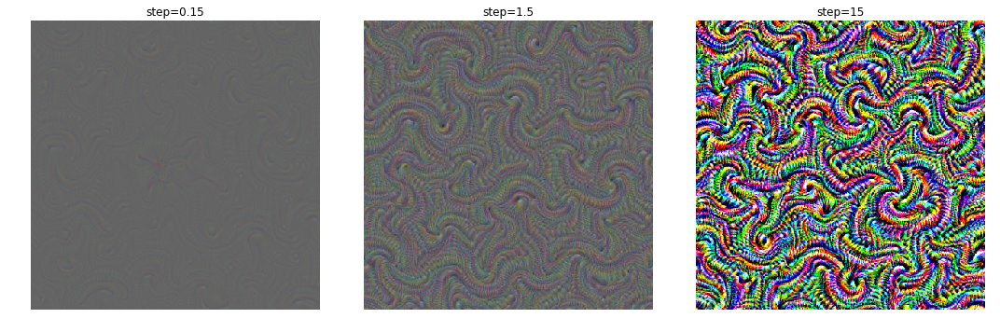

In [9]:
np.random.seed(42)
# define figure
fig = plt.figure(figsize=(15, 12))
param_grid = [0.15,1.5,15]
param_name = 'step'

# iterate over all param_grid levels
for i, param_val in enumerate(param_grid):
    # save rendered feature map
    rendered_noise = load_render_deepdream(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph,
                                           step=param_val,
                                           render_image=False)
    a=fig.add_subplot(1,3,i+1)
    plt.imshow(rendered_noise)
    plt.axis('off')
    plt.tight_layout()
    plt.title(param_name + '=' + str(param_val))

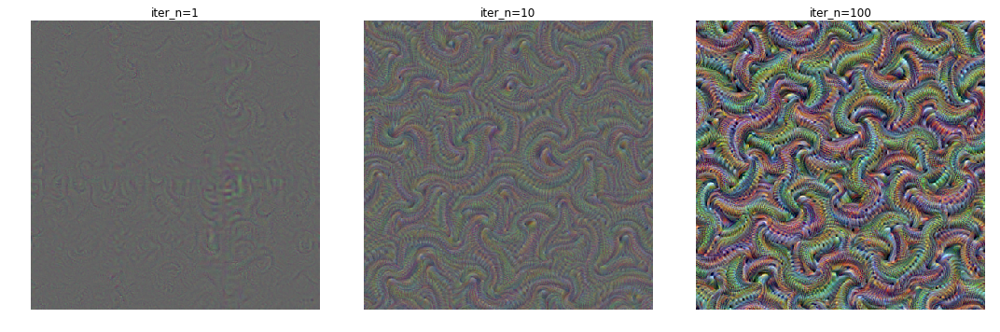

In [10]:
# define figure
fig = plt.figure(figsize=(15, 12))
param_grid = [1,10,100]
param_name = 'iter_n'

# iterate over all param_grid levels
for i, param_val in enumerate(param_grid):
    # save rendered feature map
    rendered_noise = load_render_deepdream(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph,
                                           iter_n=param_val,
                                           render_image=False)
    a=fig.add_subplot(1,3,i+1)
    plt.imshow(rendered_noise)
    plt.axis('off')
    plt.tight_layout()
    plt.title(param_name + '=' + str(param_val))

<a id='filters'></a>
## Visualization of filters' effects

One of the properties of convolutional neural networks (CNN) is that lower-level layers capture rather small-sized patterns. As we move up through the network to the upper layers the patterns grow more complex.

Purpose of this part is to show how different feature map look like when visualized on the random noise images.  Whereas inception modules with lower id (e.g. `mixed3a`, i.e. modules which are closer to input data) show relatively simple patterns, higher-level modules (e.g. `mixed5b`) show relatively more complex patterns.

You can tweak the `map_numbers` parameter to display different feature maps within an inception modules' layers.

1/6   2/6   3/6   4/6   5/6   6/6   

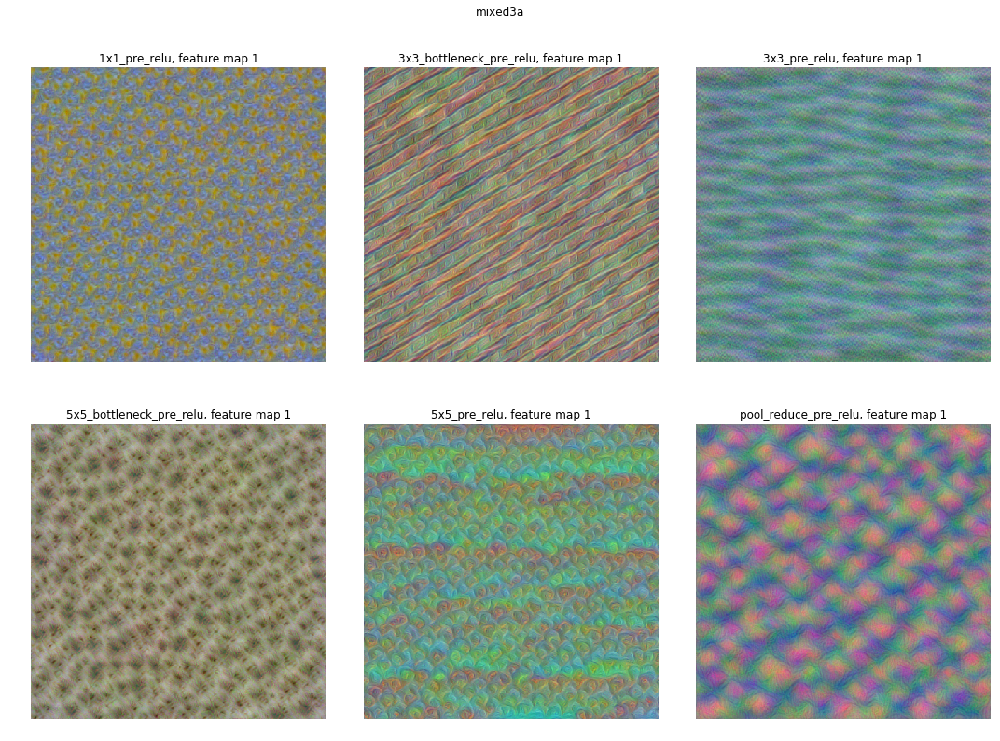

In [8]:
plot_inception_module(graph=graph, t_input=t_input, sess=sess, inception_module_id='mixed3a', 
                      map_numbers=[1,1,1,1,1,1])

1/6   2/6   3/6   4/6   5/6   6/6   

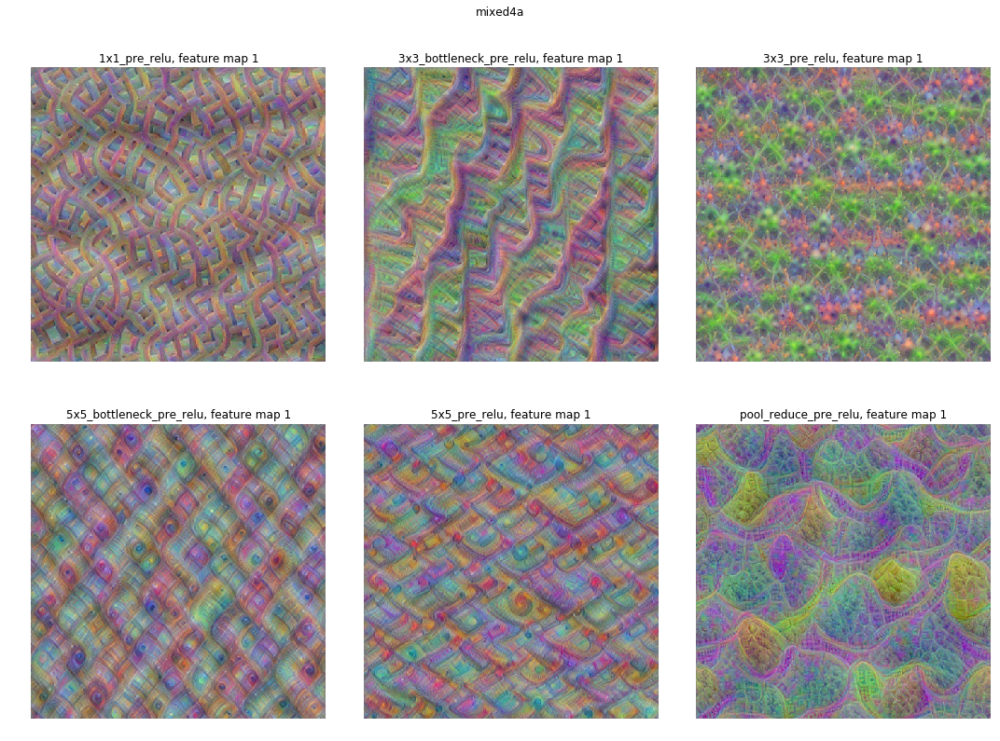

In [124]:
plot_inception_module(graph, t_input, sess, inception_module_id='mixed4a',map_numbers=[1,1,1,1,1,1])

1/6   2/6   3/6   4/6   5/6   6/6   

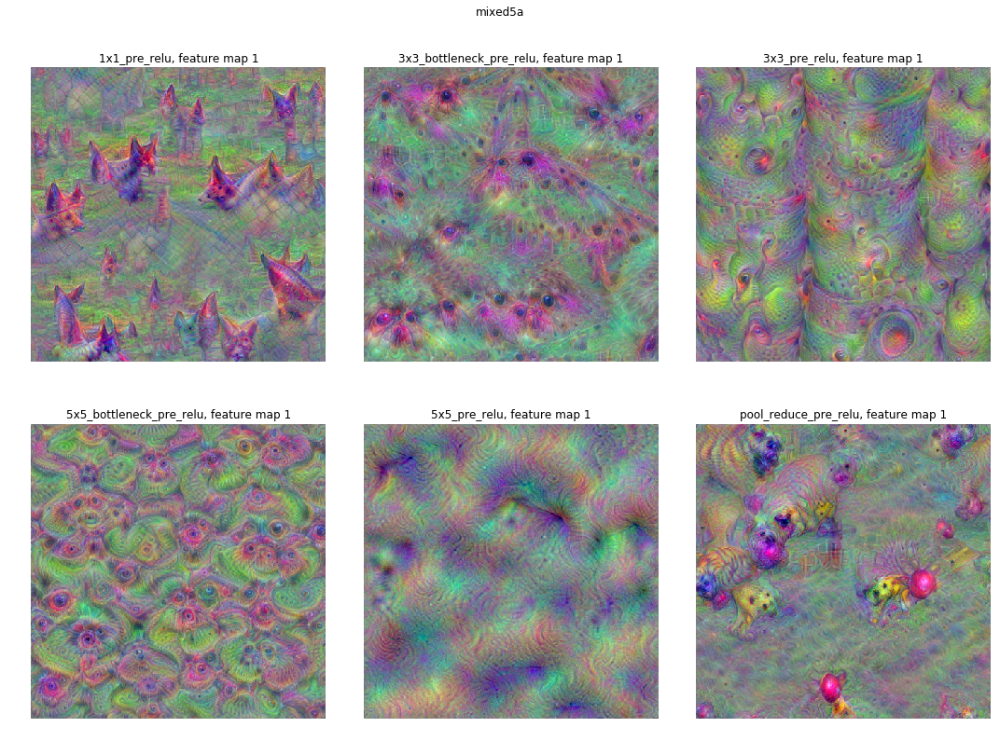

In [191]:
plot_inception_module(graph, t_input, sess, inception_module_id='mixed5a')

1/6   2/6   3/6   4/6   5/6   6/6   

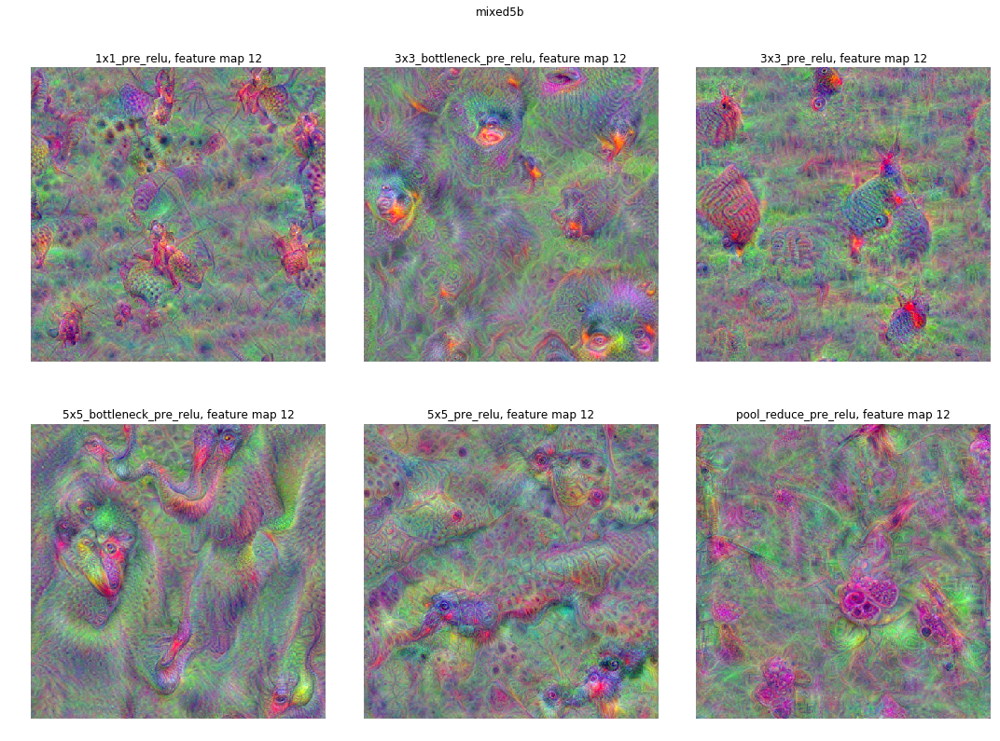

In [125]:
plot_inception_module(graph, t_input, sess, inception_module_id='mixed5b', map_numbers=[1,5,7,7,10,12])

<a id='deepdreaming'></a>
## Deepdreaming

The following part shows the "deepdream effect" applied on various images in a similar way as in the [original Deepdream tutorial](https://github.com/tensorflow/tensorflow/blob/master/tensorflow/examples/tutorials/deepdream/deepdream.ipynb). Both an original image and a transformed one are shown. 

The network was trained mostly on nature-related images and therefore mostly flowers-like and animal-like patterns emerege in the images. Notice therefore that e.g. in the checker image below which include only simple geometry does not show much of these patterns.

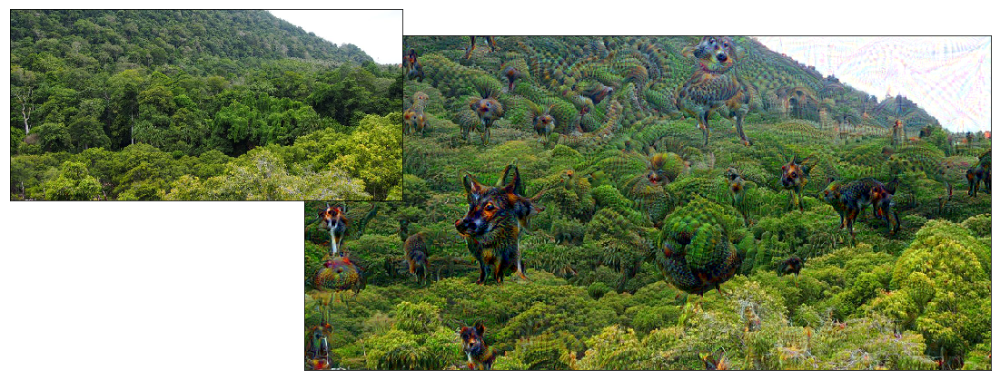

In [54]:
render_deepdream_w_original(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph, 
                               img0="../img_in/prales.jpg", save_path="../img_out/prales.jpg")

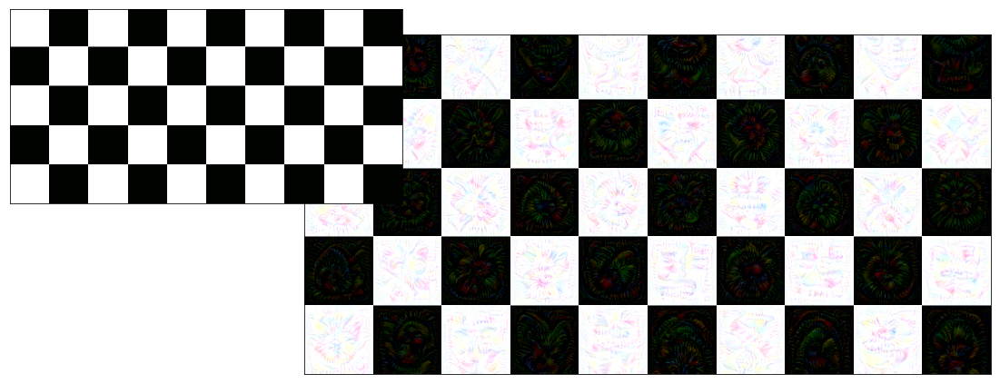

In [55]:
render_deepdream_w_original(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph, 
                               img0="../img_in/checker.jpg", save_path="../img_out/checker.jpg")

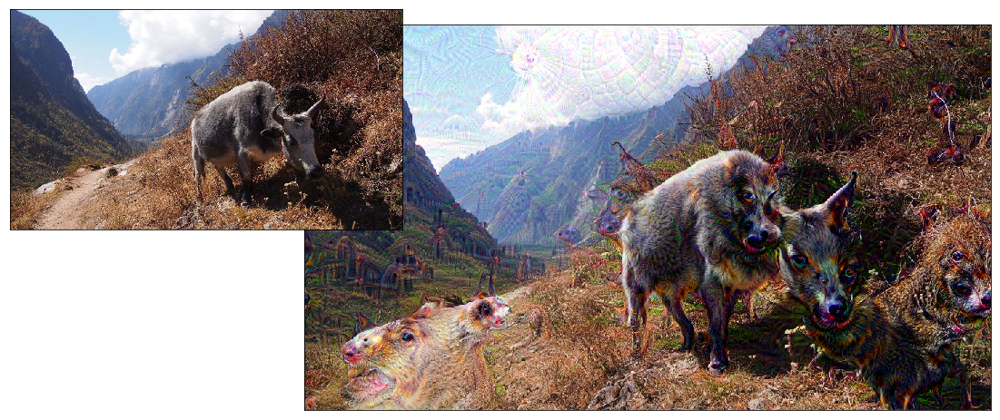

In [56]:
render_deepdream_w_original(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph, 
                               img0="../img_in/langtang.jpg", save_path="../img_out/langtang.jpg")

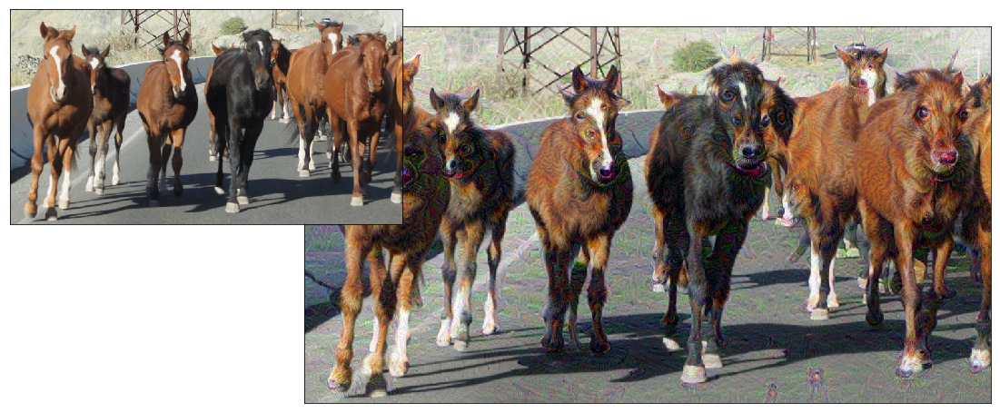

In [57]:
render_deepdream_w_original(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph, 
                               img0="../img_in/horses.jpg", save_path="../img_out/horses.jpg")

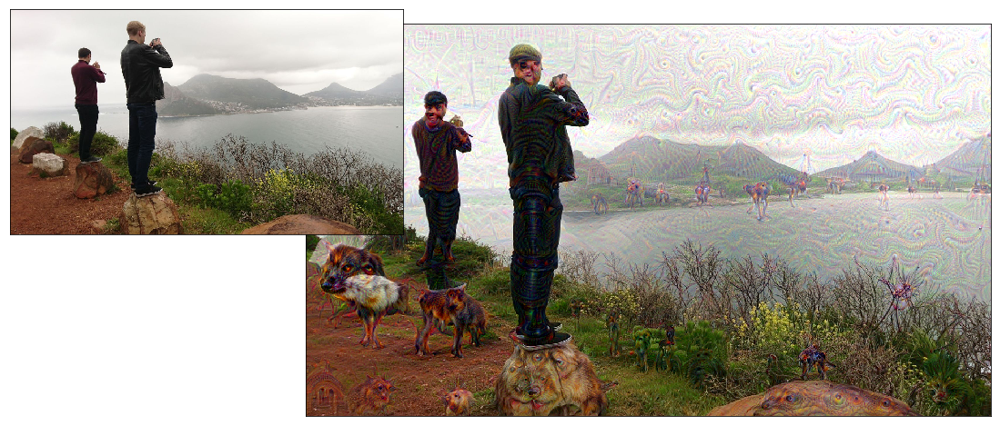

In [58]:
render_deepdream_w_original(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph, 
                               img0="../img_in/cape_town_mid_b.jpg", save_path="../img_out/cape_town_mid_b.jpg")

Let us also have a look at a detail of the last picture.  

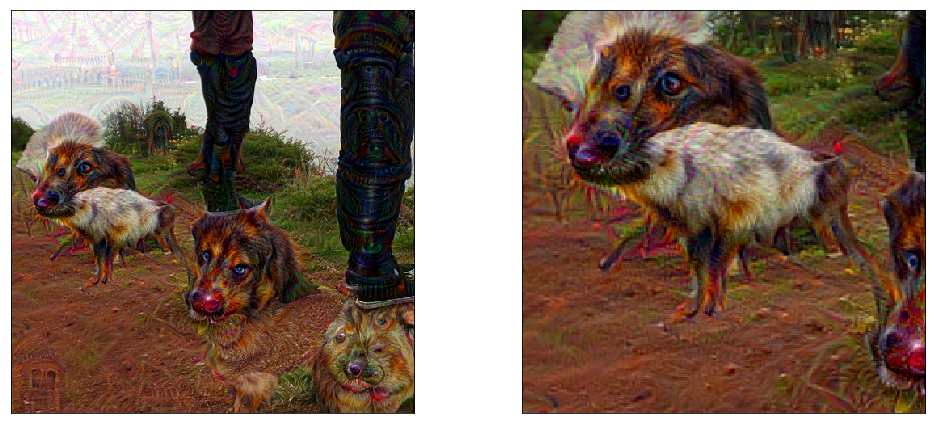

In [59]:
# cropping function
def crop_center(img,hor_0,vert_0,w,h):
    h0,w0,rgb = img.shape  
    return img[(h0-vert_0-h):(h0-vert_0),hor_0:(hor_0+w),:]

# load the image
image_to_crop = load_render_deepdream(t_obj='mixed4c', t_input=t_input, sess=sess, graph=graph,
                      img0="../img_in/cape_town_mid_b.jpg",render_image=False)

# get details
cropped_1 = crop_center(image_to_crop,0,0,500,500)
cropped_2 = crop_center(cropped_1,0,100,250,250)

# plot it
fig, axes = plt.subplots(nrows=1, ncols=2)
axes[0].imshow(cropped_1)
axes[0].set_yticklabels([])
axes[0].set_yticks([])
axes[0].set_xticklabels([])
axes[0].set_xticks([])
axes[1].imshow(cropped_2)
axes[1].set_yticklabels([])
axes[1].set_yticks([])
axes[1].set_xticklabels([])
axes[1].set_xticks([])
plt.tight_layout()

What a wierd stones!